# Diabetes Diagnosis Classificator

 ### University of Porto - School of Engineering

 #### Masters in Data Science and Engineering - MECD/FEUP
 
 #### Students: Ian Karkles and Sónia Ferreira

## Approach using CRISP-DM Methodology
### Business Context - Diabetes Classificator
> Diabetes is a worldwide disease, with more than 500 million people living with it today, nearly one in ten living with it.

>Even with a high number of people living with this disease, 3 out of 4 are from low and medium-income countries that do not have the resources to map and treat rightfully this disease, which may affect the daily life of a person who is not aware of this illness.

>One of the main reasons for the lack of the right diagnosis is the lack of technical skills to interpret the results of exams in these low-income countries.

>In this way, the main idea of this classifier is to guide low and medium-income health professionals to classify a Diabetes case with simple exams in a person who most probably would be unaware of the disease until would be too late.

Source: International Diabetes Federation. (2021). IDF Diabetes Atlas 10th edition 2021. Diabetesatlas.org. https://diabetesatlas.org/

### Data Context - What is the available data and how it's distributed
>In the context of Data Classification, there a multiple classification methods that can help to solve this type of problem. For this type of problem, we gathered this famous dataset from Kaggle: https://www.kaggle.com/uciml/pima-indians-diabetes-database, which have a 8.9 Score on the Kaggle Usability Score

> This dataset contains multiple features that can help the classifier model to rightfully classify the case of diabetes or not.

The Dataset have the following columns to explore:


Columns  | Meaning
-------------------|------------------
Pregnancies               | Number of times pregnant
Glucose                   | Plasma Glucose concentration a 2 hours in a oral glucose tolerance test
BloodPressure             | Diastolic blood pressure (mm/Hg) 
SkinThickness             | The Triceps skin fold thickness (mm)
Insulin                   | 2-Hour serum insulin (MuU/ml)
BMI                       | Body Mass Index (weight in Kg/(height in m)^2)
DiabetesPedigreeFunction  | Diabetes pedigree function
Age                       | Age of the Pacient in Years
Outcome                   | Class variable (0 or 1) 268 of 768 are 1 and the others are 0



# Diabetes Diagnosis Classificator - Source Code

## **Library Imports and Data Extration**

In [5]:
import pandas                  as pd
import numpy                   as np
from pandas_profiling          import ProfileReport
from pandas.plotting           import scatter_matrix
import matplotlib.pyplot       as plt
import seaborn                 as sns
import missingno               as msno
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.ensemble          import IsolationForest

In [6]:
# Dataset to be used: https://www.kaggle.com/uciml/pima-indians-diabetes-database

df = pd.read_csv('diabetes.csv')
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


## **Exploratory Data Analysis (EDA)** <br>
<br>
This section seeks to answer the questions listed in the business context section. The data will be analized and vizualized for easy understanding and followed with appropriated statistical analysis for empirical findings within the data. <br>
The following questions will be answered within this section:
*   ...<br>
*   ...<br>
*   ...<br>

<br>

#### !!!!! list the questions from the business context section.


In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Dataset information:

In [8]:
shape = df.shape #total nr of rows and colums
print(f"Dataframe shape: {shape}")

Dataframe shape: (768, 9)


In [9]:
df.info(verbose=True) #colums and corresponding data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Dataset comprises of 768 observations and 9 characteristicts. <br>
Out of which one is a dependent variable and the remain are independent:
*   Dependendent variable: Outcome;
*   Independent variable: All of the rest of the Features.

### Missing Values

In [10]:
df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

<AxesSubplot:>

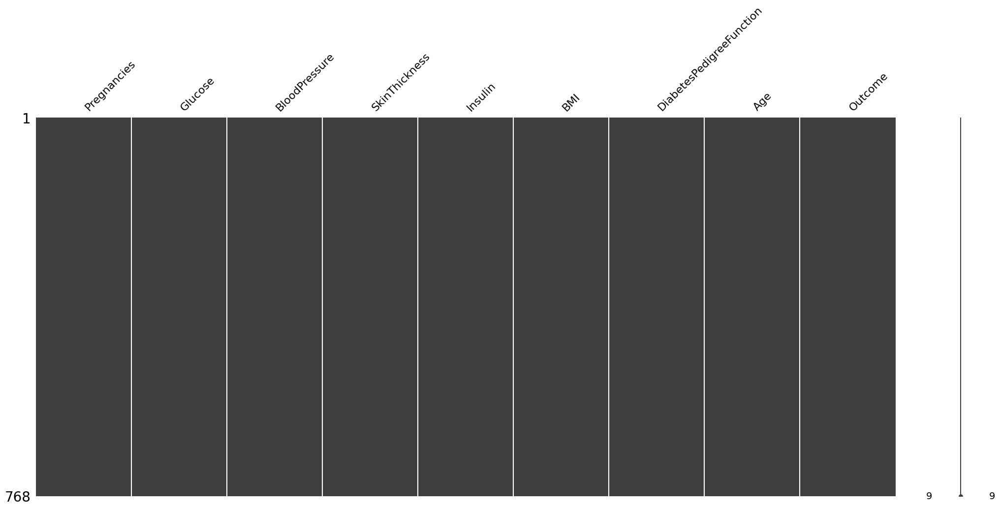

In [19]:
%matplotlib inline  
# to display the plot next to the code
msno.matrix(df)

### Redundant Data

In [20]:
df.duplicated().value_counts() # check for duplicate values

False    768
dtype: int64

### Plotting individual data to have a better undersand of the dataset

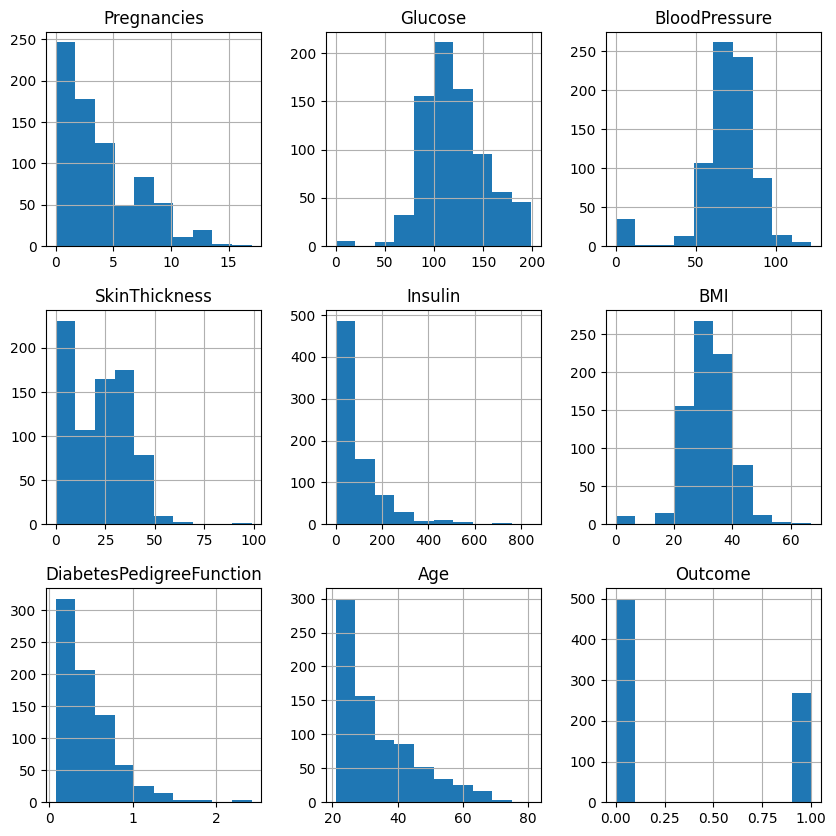

In [21]:
# Plotting Data to understand the distribution
plot = df.hist(figsize = (10,10))

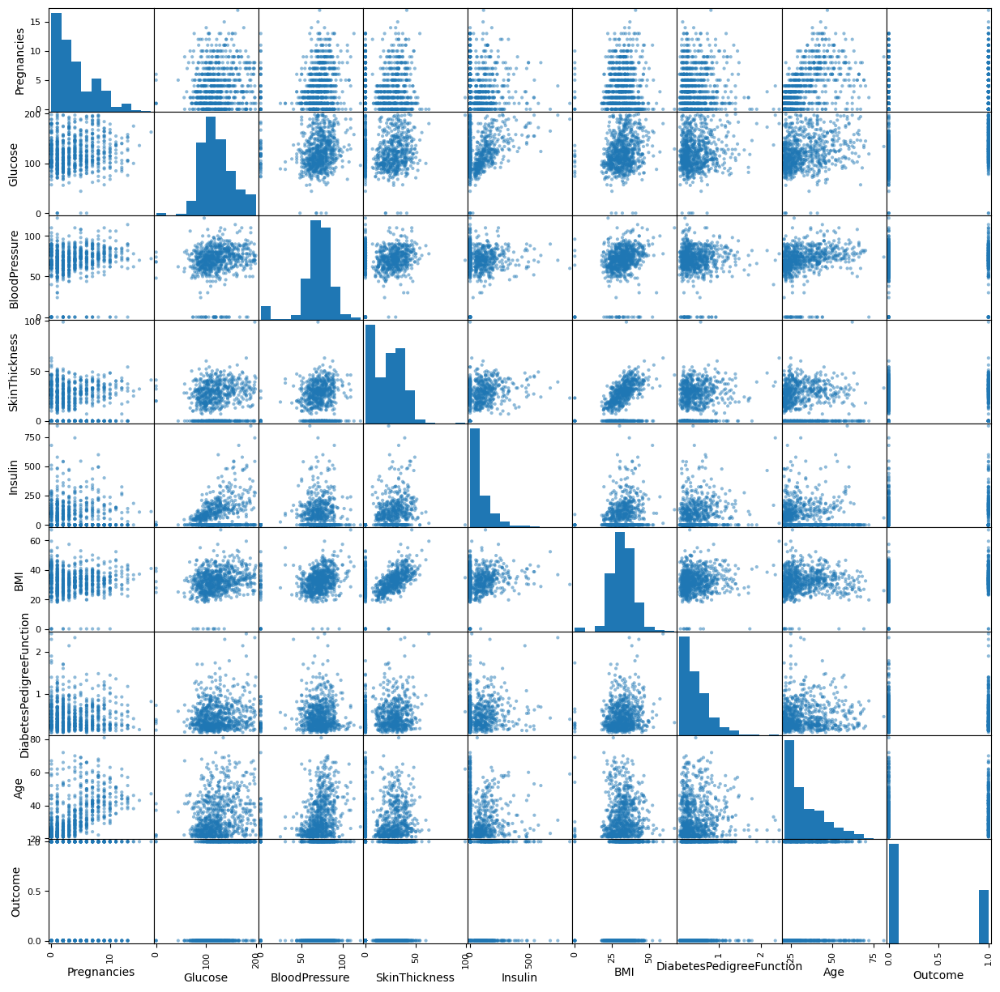

In [22]:
plot =scatter_matrix(df,figsize=(15, 15))

However, due to zero values, we have a few NaN values classified as Zero, for example in Skin Thickness (that represents the triceps skin fold thickness) and Glucose.

**Understanding/studing the 0 values observed on the plots**

In [23]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['SkinThickness']==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
9,8,125,96,0,0,0.0,0.232,54,1
10,4,110,92,0,0,37.6,0.191,30,0
...,...,...,...,...,...,...,...,...,...
757,0,123,72,0,0,36.3,0.258,52,1
758,1,106,76,0,0,37.5,0.197,26,0
759,6,190,92,0,0,35.5,0.278,66,1
762,9,89,62,0,0,22.5,0.142,33,0


In [24]:
print("Skin Thickness Values in mm:",sorted(df.SkinThickness.unique()))

Skin Thickness Values in mm: [0, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 56, 60, 63, 99]


In [25]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['Glucose']==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
75,1,0,48,20,0,24.7,0.140,22,0
182,1,0,74,20,23,27.7,0.299,21,0
342,1,0,68,35,0,32.0,0.389,22,0
349,5,0,80,32,0,41.0,0.346,37,1
502,6,0,68,41,0,39.0,0.727,41,1


In [26]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['BloodPressure']==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
7,10,115,0,0,0,35.3,0.134,29,0
15,7,100,0,0,0,30.0,0.484,32,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
78,0,131,0,0,0,43.2,0.270,26,1
81,2,74,0,0,0,0.0,0.102,22,0
172,2,87,0,23,0,28.9,0.773,25,0
193,11,135,0,0,0,52.3,0.578,40,1
222,7,119,0,0,0,25.2,0.209,37,0
261,3,141,0,0,0,30.0,0.761,27,1


##**To do (ver se é aplicavél neste proj) !!!!**
- Inconsistent Data (podemos referir os zeros aqui)
- Noisy Data 

### Statistics of the Dataset

In [27]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


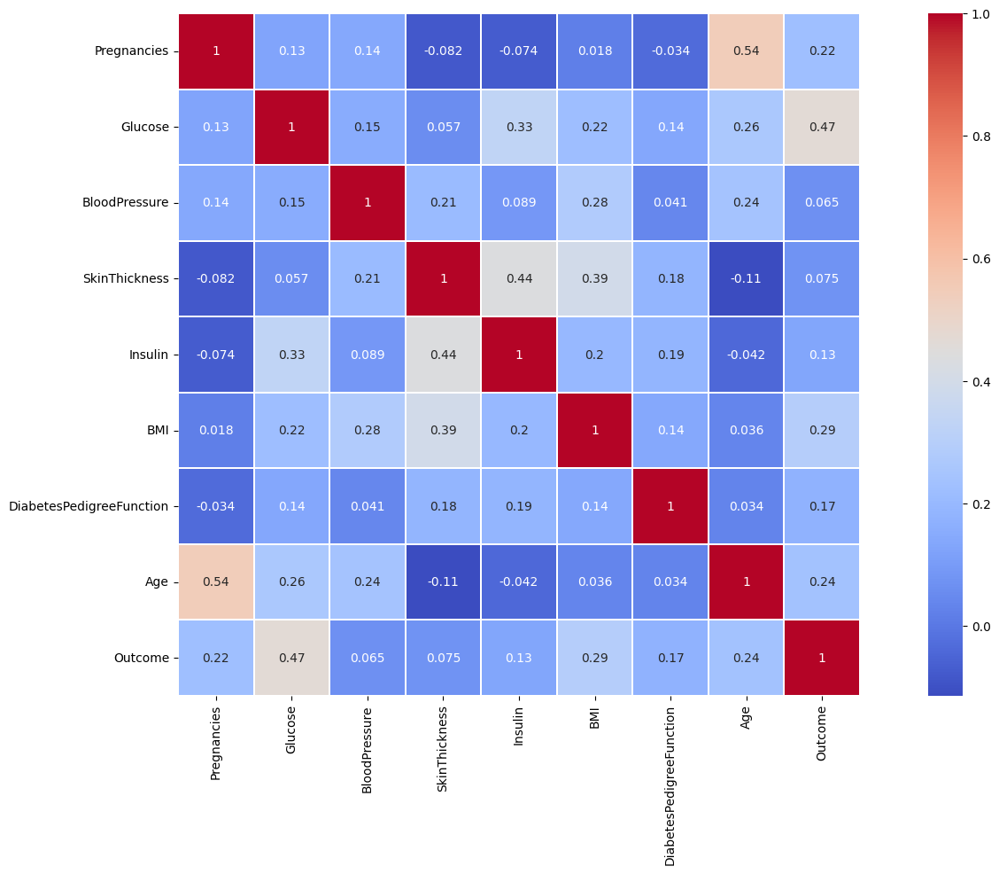

In [28]:
plt.subplots(figsize=(20, 10))
sns.heatmap(df.corr(),  square=True,  annot=True,linewidths=0.1, cmap="coolwarm")
plt.show()

#### Outliers

Good Resource for Outliers: https://www.kaggle.com/code/nareshbhat/outlier-the-silent-killer

For detecting Outliers in the Dataset we should start with a fairly simple Z-Score Testing, to check if the present values are more than 3 standard deviations from the mean.

In [29]:
def Zscore_outlier(df):
    out = []
    m = np.mean(df)
    sd = np.std(df)
    for i in df: 
        z = (i-m)/sd
        if np.abs(z) > 3: 
            out.append(i)
    print(f"Outliers:",out)
    out = []

def Winsorization_outliers(df):
    out = []
    q1 = np.percentile(df , 1)
    q3 = np.percentile(df , 99)
    for i in df:
        if i > q3 or i < q1:
            out.append(i)
    print("Outliers:",out)
    out = []

In [30]:
for i in df.columns:
    print(f'From the Column: {i}')
    Zscore_outlier(df[i])

From the Column: Pregnancies
Outliers: [15, 17, 14, 14]
From the Column: Glucose
Outliers: [0, 0, 0, 0, 0]
From the Column: BloodPressure
Outliers: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
From the Column: SkinThickness
Outliers: [99]
From the Column: Insulin
Outliers: [543, 846, 495, 485, 495, 478, 744, 680, 545, 465, 579, 474, 480, 600, 440, 540, 480, 510]
From the Column: BMI
Outliers: [0.0, 0.0, 0.0, 0.0, 0.0, 67.1, 0.0, 0.0, 59.4, 0.0, 0.0, 57.3, 0.0, 0.0]
From the Column: DiabetesPedigreeFunction
Outliers: [2.288, 1.893, 1.781, 2.329, 1.476, 2.137, 1.731, 1.6, 2.42, 1.699, 1.698]
From the Column: Age
Outliers: [69, 72, 81, 70, 69]
From the Column: Outcome
Outliers: []


In [31]:
for i in df.columns:
    print(f'From the Column: {i}')
    Winsorization_outliers(df[i])

From the Column: Pregnancies
Outliers: [15, 17, 14, 14]
From the Column: Glucose
Outliers: [197, 44, 0, 0, 197, 0, 0, 197, 0, 198, 197, 199, 56]
From the Column: BloodPressure
Outliers: [110, 108, 122, 110, 108, 110, 114]
From the Column: SkinThickness
Outliers: [60, 54, 56, 54, 52, 63, 52, 99]
From the Column: Insulin
Outliers: [543, 846, 744, 680, 545, 579, 600, 540]
From the Column: BMI
Outliers: [53.2, 55.0, 67.1, 52.3, 52.3, 52.9, 59.4, 57.3]
From the Column: DiabetesPedigreeFunction
Outliers: [2.288, 1.893, 1.781, 0.088, 0.085, 0.084, 2.329, 0.089, 0.092, 0.078, 2.137, 1.731, 2.42, 0.085, 1.699, 0.088]
From the Column: Age
Outliers: [69, 72, 81, 70, 68, 69]
From the Column: Outcome
Outliers: []


Testing the Dataset for Outliers, with the Z-Testing and Winsorization was found out pointed out some values that required a little bit more of attention on the Dataset. However, even that they were considered outliers, this values are possible to be achieve and rarer medical cases and have support from the research did by the group.

Source: Diabetes - Diagnosis and treatment - Mayo Clinic. (2022, October 25). https://www.mayoclinic.org/diseases-conditions/diabetes/diagnosis-treatment/drc-20371451

#### Data Vizualization before treatment (Pre Processing)

##**TO DO algums gráficos com dados do df original como age vs outcome, glucose vs outcome... etc...**

### Pre Processing

In [32]:
df_copy = df.copy(deep = True)
df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

## showing the count of Nans
print(df_copy.isnull().sum())

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


In [33]:
# Inputing the missing values with their most useful parameters: mean or median.

df_copy['Glucose'].fillna(df_copy['Glucose'].mean(), inplace = True)
df_copy['BloodPressure'].fillna(df_copy['BloodPressure'].mean(), inplace = True)
df_copy['SkinThickness'].fillna(df_copy['SkinThickness'].median(), inplace = True)
df_copy['Insulin'].fillna(df_copy['Insulin'].median(), inplace = True)
df_copy['BMI'].fillna(df_copy['BMI'].median(), inplace = True)

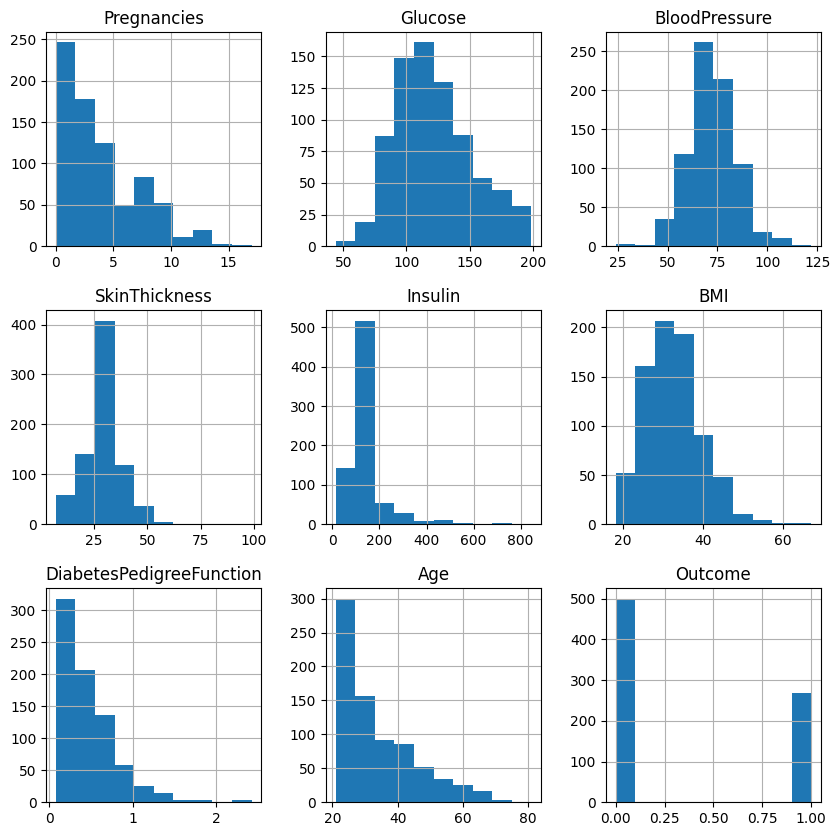

In [34]:
p = df_copy.hist(figsize = (10,10))

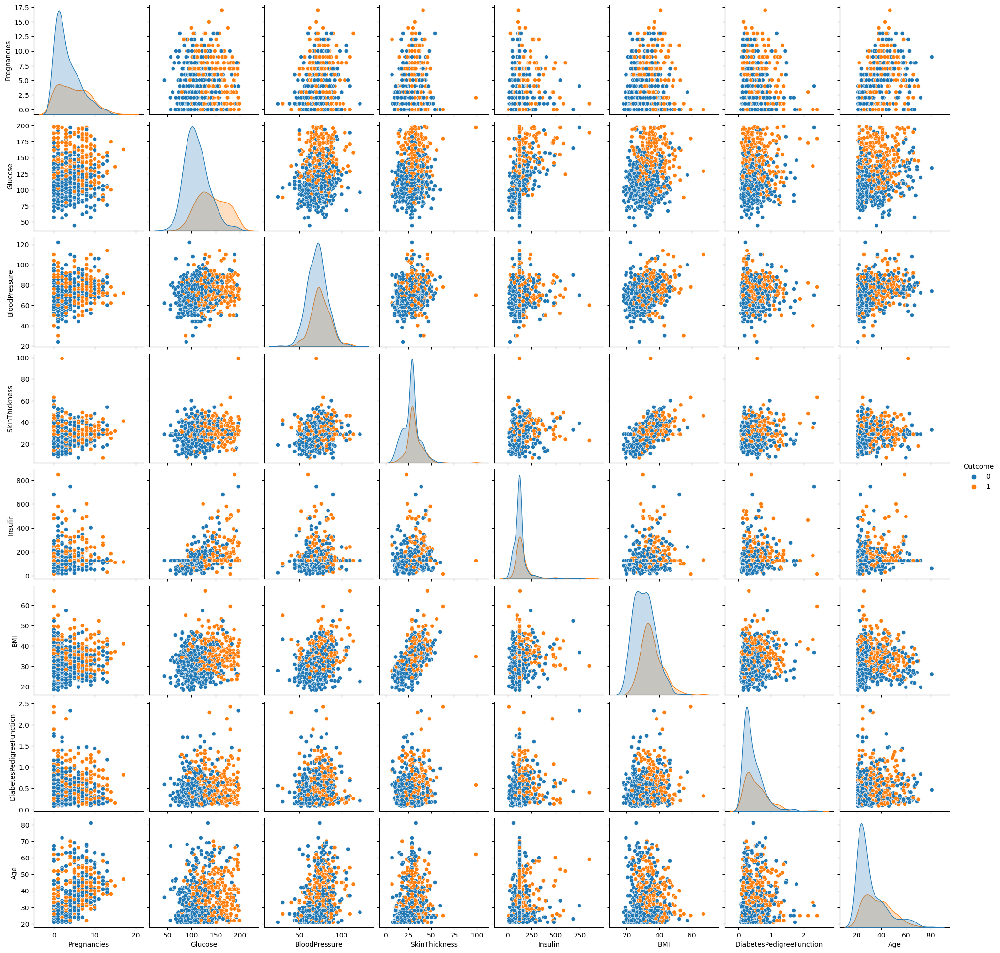

In [35]:
p=sns.pairplot(df_copy, hue = 'Outcome')

To do:
## Pre processing   - was this for Feauture selection?
- Standard Scaler
- PCA
- Hiperparams Fine Tunning
- Drop Outliers


## Feature Selection

Dicker-Fuller Test

In [36]:
# Testing For Stationarity - Dicker-Fuller test
import statsmodels
from statsmodels.tsa.stattools import adfuller

print ('Results of Dickey-Fuller Test:')
def adfuller_test(activePower):
    result = adfuller(activePower)
    labels = ['ADF: ','p-value: ','Nr of Lags :','Number of Observations Used  for ADF Regression and Critical Values Calculation :']
    
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis(Ho), Reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("Weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")
    
    
        
adfuller_test(df_copy['Outcome'])

Results of Dickey-Fuller Test:
ADF:  : -27.413007145391038
p-value:  : 0.0
Nr of Lags : : 0
Number of Observations Used  for ADF Regression and Critical Values Calculation : : 767
Strong evidence against the null hypothesis(Ho), Reject the null hypothesis. Data has no unit root and is stationary


In [37]:

x = df_copy[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age']]
y = df_copy['Outcome']

selector = SelectKBest(f_classif, k=4)
selector.fit_transform(x, y,)
cols = selector.get_support(indices=True)
df_selected = x.iloc[:,cols]

#scores = -np.log10(selector.pvalues_)
#scores /= scores.max()

print(df_selected.columns)

Index(['Pregnancies', 'Glucose', 'BMI', 'Age'], dtype='object')


In the case of need to reduce the complexity of the model and using fewer variables, these would be the 4 most important variables to be part of the process. However, in this meantime, the regular dataset utilized on this work to do not require this type of 


## Models

Good Resource: https://www.kaggle.com/code/pouryaayria/a-complete-ml-pipeline-tutorial-acu-86
- KNN Classifier
- Random Forest
- Decision Tree
- Adaboost
- Logistic Regression
- Gaussian NB
- ExtraTreesClassifier
- XgBoost Classifier



## Evaluation
- Confusion Matrix
- F1 Scores (Recall + Precision)
- ROC and AUC